# Project Report

## Correlation between the proximity of public transport stops and the rental prices of apartments in Nuremberg.

### Summary
This project aims to analyze the correlation between the proximity of public transport stops and the rental prices of apartments in Nuremberg.

### Rationale
By understanding the relationship between public transport stops and rental prices, this analysis can provide valuable insights for renters, landlords, and city planners in optimizing public transportation networks and improving the accessibility of housing in Nuremberg.


## Project Flow

## 1. Data Acquisition:
   - Obtain the Nuremberg Stops dataset from the provided metadata URL and download the corresponding xlsx file.
   - Obtain the Immoscout24 dataset from the provided metadata URL and download the corresponding xlsx file.

### Datasources
#### Datasource1: Nuremberg Stops: IDs and geodata
* Metadata URL: [https://mobilithek.info/offers/-6228947429763481687](https://mobilithek.info/offers/-6228947429763481687) <br />
* Data URL: [https://opendata.vag.de/dataset/08eb49f9-0f6c-4b76-96fd-5f8e3a0ac593/resource/c66d5b67-6a01-4190-a9cf-1de6359d07ae/download/20170601_haltestellen_id_geo.xlsx](https://opendata.vag.de/dataset/08eb49f9-0f6c-4b76-96fd-5f8e3a0ac593/resource/c66d5b67-6a01-4190-a9cf-1de6359d07ae/download/20170601_haltestellen_id_geo.xlsx) <br />
* Data Type: xlsx

This dataset provides information on all subway, tram, and bus stops in the VAG area of Nuremberg, including their IDs and geolocation data.

#### Datasource2: Immoscout24 dataset
* Metadata URL: [https://www.kaggle.com/datasets/corrieaar/apartment-rental-offers-in-germany](https://www.kaggle.com/datasets/corrieaar/apartment-rental-offers-in-germany) <br />
* Data URL: [https://www.kaggle.com/datasets/corrieaar/apartment-rental-offers-in-germany/download?datasetVersionNumber=6](https://www.kaggle.com/datasets/corrieaar/apartment-rental-offers-in-germany/download?datasetVersionNumber=6) <br />
* Data Type: xlsx

This dataset contains rental property listings on Immoscout24, the largest real estate platform in Germany, including information on rental prices, property attributes, and location.


##  2. Data Preprocessing:
   - Load and explore the Nuremberg Stops and Immoscout24 dataset.
   - Clean the datasets by removing irrelevant columns and handling missing values.
   - Perform any necessary data transformations or feature engineering.
   - Extract Latitude and Longitude and save in Database for Immoscout24.

##### To load Data from data sources run 'data_extractor.sh' from terminal

```
"=== Executing pipeline ==="
python project/data/pipeline.py

echo "=== Extracting  LAT LNG ==="
python project/LatLngExtractor.py
```


### Dependencies for Data Extractor

```
import pandas as pd
import numpy as np
from time import time
import sqlite3
from geopy.geocoders import Nominatim
```

### Extraction:
```
def data_extraction_xls(path):
    t1 = time()
    print("Data Extraction in progress...")

    try:
        df = pd.read_excel(path)
    except Exception as e:
        print("Error occurred during file reading:", str(e))
        return None
    t2 = time()
    print("Finish: Data Extraction {} s ".format(t2 - t1))
    return df
```

### Transformation:

```
def data_transformation(data_frame, rename_col, drop_col):
    t1 = time()
    print("Data Transformation in progress...")
    # Renaming the columns to english titles
    if rename_col:
        print("Renaming the columns to english titles...")
        data_frame = data_frame.rename(columns=rename_col)

    print("Removing Unwanted Columns...")
    if drop_col:
        data_frame = data_frame.drop(columns=drop_col)

    print("Replacing Nan Values...")
    # Replace Nan values with 0
    data_frame = data_frame.replace(np.nan, 0)
    t2 = time()
    print("Finish: Data Transformation {} s ".format(t2 - t1))
    return data_frame
```

### Load:

```
def data_loader(db_file, data_frame, table_name):
    t1 = time()
    print("SQLite DB Operations....")
    # Connect to the SQLite databases
    conn = sqlite3.connect(db_file)

    # Store the data in the specified tabless
    data_frame.to_sql(table_name, conn, if_exists='replace', index=False)
    # Close the database connection
    conn.close()
    t2 = time()
    print("Finish: Data Loading  {} s ".format(t2 - t1))

```

### Driver:
```
    path_Immoscout24 = "https://docs.google.com/spreadsheets/d/1yIMw92dv7yeztmDHAt8mvO74jFhTc9dS/export?format=xlsx"
    df1 = data_extraction_xls(path_Immoscout24)
    df1_drop_cols = ["picturecount", "scoutId", "geo_bln", "geo_krs"]
    df1_rename_cols = {
        "regio1": "federalState",
        "geo_plz": "zipCode",
        "regio2": "district",
        "regio3": "cityTown"
    }
    df1 = data_transformation(df1, df1_rename_cols, df1_drop_cols)
    data_loader("nuremberg_stops_immoscout.sqlite", df1, "immoscout")

    path_nuremberg = "https://docs.google.com/spreadsheets/d/19ASmxyaSSeiuWbagvZmzixJr261bTkoQ/export?format=xlsx"
    df2 = data_extraction_xls(path_nuremberg)
    df2_drop_cols = {"breakpoint", "GlobalID", "branchOfService", "dataprovider"}
    df2_rename_cols = {
        "VGNKennung": "VAGIdentifier",
        "VAGKennung": "VAGIdentifierChar",
        "Haltepunkt": "breakpoint",
        "GlobalID": "GlobalID",
        "Haltestellenname": "stopName",
        "latitude": "latitude",
        "longitude": "longitude",
        "Betriebszweig": "branchOfService",
        "Dataprovider": "dataprovider",
    }
    df2 = data_transformation(df2, df2_rename_cols, df2_drop_cols)
    data_loader("nuremberg_stops_immoscout.sqlite", df2, "nuremberg_stops")
```

### Extract Latitude and Longitude for Immoscout24 Dataset

#### Extraction and Saving in Database
```
# Open the SQLite database
conn = sqlite3.connect('nuremberg_stops_immoscout.sqlite')

table_immoscout = "immoscout"

# Read data from the database into a DataFrame
df_immoscout = pd.read_sql_query(f'SELECT * FROM {table_immoscout}',
                                 conn)  # Replace "table_name" with the actual table name in the database

# Create a geocoder instance
geolocator = Nominatim(user_agent="my_app")

# Initialize lists to store latitude and longitude values
latitudes = []
longitudes = []

# Iterate over each row in the DataFrame
for index, row in df_immoscout.iterrows():
    # Construct the address using the available columns from the DataFrame
    address = f"{row['houseNumber']} {row['street']}, {row['cityTown']}, {row['district']}, {row['zipCode']} , {row['federalState']}"

    # Geocode the address to retrieve latitude and longitude
    location = geolocator.geocode(address)

    # Check if location was found
    if location is not None:
        latitudes.append(location.latitude)
        longitudes.append(location.longitude)
        print(address, ":", location.latitude, location.longitude)
    else:
        latitudes.append(None)
        longitudes.append(None)

# Add latitude and longitude columns to the DataFrame
df_immoscout['latitude'] = latitudes
df_immoscout['longitude'] = longitudes

# Save the updated DataFrame back to the database
df_immoscout.to_sql(table_immoscout, conn, if_exists='replace',
                    index=False)

# Close the database connection
conn.close()

```

#### Database Structure

#### Database: nuremberg_stops_immoscout.sqlite

##### Table: immoscout
###### Columns:

| Field                   | Description                | Field                   | Description                |
|-------------------------|----------------------------|-------------------------|----------------------------|
| federalState            | State where the property is located | serviceCharge           | Additional charges for services |
| heatingType             | Type of heating system      | telekomTvOffer          | Telekom TV offer            |
| telekomHybridUploadSpeed| Telekom Hybrid Upload Speed | newlyConst              | Property is newly constructed or not |
| balcony                 | Presence of a balcony       | pricetrend              | Price trend                 |
| telekomUploadSpeed      | Telekom Upload Speed        | totalRent               | Total rent including all charges |
| yearConstructed         | Year the property was constructed | noParkSpaces            | Number of parking spaces    |
| firingTypes             | Types of firing systems     | hasKitchen              | Presence of a kitchen       |
| cellar                  | Presence of a cellar        | yearConstructedRange    | Range of year constructed   |
| baseRent                | Base rent amount            | houseNumber             | House number                |
| livingSpace             | Living space area in square meters | condition               | Condition of the property   |
| interiorQual            | Interior quality of the property | petsAllowed             | Pets allowed or not         |
| street                  | Street name                 | streetPlain             | Plain street name           |
| lift                    | Presence of a lift          | baseRentRange           | Range of base rent          |
| typeOfFlat              | Type of flat (apartment)    | zipCode                 | ZIP code                    |
| noRooms                 | Number of rooms             | thermalChar             | Thermal characteristics     |
| floor                   | Floor number                | numberOfFloors          | Total number of floors      |
| noRoomsRange            | Range of number of rooms    | garden                  | Presence of a garden        |
| livingSpaceRange        | Range of living space       | district                | District name               |
| cityTown                | City/Town name              | description             | Property description        |
| facilities              | Facilities available        | heatingCosts            | Heating costs               |
| energyEfficiencyClass   | Energy efficiency class     | lastRefurbish           | Year of last refurbishment  |
| electricityBasePrice    | Base price of electricity   | electricityKwhPrice     | Price per kWh of electricity |
| date                    | Date of data entry          | latitude                | Latitude of the location    |
| longitude               | Longitude of the location   |                          |                            |

##### Table: nuremberg_stops
###### Columns:

| Field              | Description                                          | Field                | Description                                          |
|--------------------|------------------------------------------------------|----------------------|------------------------------------------------------|
| VAGIdentifier      | Identifier for VAG (Verkehrs-Aktiengesellschaft Nürnberg) | VAGIdentifierChar    | Character representation of VAGIdentifier            |
| stopName           | Name of the public transport stop                     | latitude             | Latitude of the stop location                        |
| longitude          | Longitude of the stop location                        |                      |                                                      |


## 3. Data Analysis:
   - Merge the Nuremberg Stops dataset with the Immoscout24 dataset based on their common location attributes.
   - Perform correlation analysis between the proximity of public transport stops and rental prices.
   - Visualize the correlation using appropriate charts or plots.


### Exploratory Data Analysis

#### Data Samples

##### Table: immoscout


|----------------------|---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------|
| federalState         | Bayern                                                                                                                                                                                                  |
| serviceCharge        | 120                                                                                                                                                                                                     |
| heatingType          | central_heating                                                                                                                                                                                         |
| telekomTvOffer       | ONE_YEAR_FREE                                                                                                                                                                                           |
| telekomHybridUploadSpeed | 0                                                                                                                                                                                                       |
| newlyConst           | 0                                                                                                                                                                                                       |
| balcony              | 1                                                                                                                                                                                                       |
| pricetrend           | 5.49                                                                                                                                                                                                    |
| telekomUploadSpeed   | 40                                                                                                                                                                                                      |
| totalRent            | 720                                                                                                                                                                                                     |
| yearConstructed      | 1936                                                                                                                                                                                                    |
| noParkSpaces         | 0                                                                                                                                                                                                       |
| firingTypes          | district_heating                                                                                                                                                                                        |
| hasKitchen           | 0                                                                                                                                                                                                       |
| cellar               | 1                                                                                                                                                                                                       |
| yearConstructedRange | 1                                                                                                                                                                                                       |
| baseRent             | 600                                                                                                                                                                                                     |
| houseNumber          | 0                                                                                                                                                                                                       |
| livingSpace          | 50                                                                                                                                                                                                      |
| condition            | first_time_use_after_refurbishment                                                                                                                                                                      |
| interiorQual         | 0                                                                                                                                                                                                       |
| petsAllowed          | no_information                                                                                                                                                                                          |
| street               | Nürnberg                                                                                                                                                                                                |
| streetPlain          | Gugelstraße                                                                                                                                                                                             |
| lift                 | 0                                                                                                                                                                                                       |
| baseRentRange        | 1                                                                                                                                                                                                       |
| typeOfFlat           | other                                                                                                                                                                                                   |
| zipCode              | 90459                                                                                                                                                                                                   |
| noRooms              | 2                                                                                                                                                                                                       |
| thermalChar          | 69.8                                                                                                                                                                                                    |
| floor                | 3                                                                                                                                                                                                       |
| numberOfFloors       | 4                                                                                                                                                                                                       |
| noRoomsRange         | 2                                                                                                                                                                                                       |
| garden               | 0                                                                                                                                                                                                       |
| livingSpaceRange     | 2                                                                                                                                                                                                       |
| district             | Nürnberg                                                                                                                                                                                                |
| cityTown             | Gibitzenhof                                                                                                                                                                                             |
| description          | Bei diesem Objekt handelt es sich um ein renoviertes 11 Parteien Mehrfamilienhaus in Nürnberg-Gibitzenhof. Diese gut geschnittene 2-Zimmer-Wohnung mit Balkon befindet sich im 2. OG. Der Ausblick v... |
| facilities           | - Bad mit Dusche und Fenster\n- Linoleumböden\n- Kunststofffenster\n- Elektrische Rollläden\n- Kabelanschluss\n- Zustand: gepflegt, renoviert, saniert\n                                                                                                                                                                                                        |
| heatingCosts         | 0                                                                                                                                                                                                       |
| energyEfficiencyClass | B                                                                                                                                                                                                       |
| lastRefurbish        | 2017                                                                                                                                                                                                    |
| electricityBasePrice | 0                                                                                                                                                                                                       |
| electricityKwhPrice  | 0                                                                                                                                                                                                       |
| date                 | 20-Feb                                                                                                                                                                                                  |
| latitude             | NaN                                                                                                                                                                                                     |
| longitude            | NaN                                                                                                                                                                                                     |




##### Table: nuremberg_stops


| VAGIdentifier | VAGIdentifierChar | stopName         | latitude  | longitude  |
|---------------|------------------|------------------|-----------|------------|
| 101           | WT               | Weißer Turm      | 49.450071 | 11.070433  |
| 101           | WT               | Weißer Turm      | 49.449634 | 11.068995  |
| 148           | WEINTR           | Weintraubengasse | 49.454224 | 11.073774  |
| 148           | WEINTR           | Weintraubengasse | 49.454395 | 11.073731  |
| 149           | EGID-P           | Egidienplatz     | 49.455715 | 11.082086  |


#### Apartment Listing

```
apartments_wrt_town = df_immoscout.groupby('cityTown').size()
apartments_wrt_town = apartments_wrt_town.sort_values(ascending=False)


# Prepare the data for the table
table_data = []
for x in range(len(apartments_wrt_town)):
    table_data.append([apartments_wrt_town.index[x], apartments_wrt_town[x]])

# Define the table headers
headers = ["Town", "Frequency Apartments"]

# Print the table with beautiful formatting
print(tabulate(table_data, headers=headers, tablefmt="fancy_grid"))
```

#### Plots for Apartment

#### BAR PLOT

```
apartments_wrt_town_sorted = apartments_wrt_town.sort_values(ascending=False)

# Plot the bar chart
plt.figure(figsize=(12, 6))
apartments_wrt_town_sorted.plot(kind='bar')
plt.title('Frequencies of Apartments based on Towns')
plt.xlabel('Town')
plt.ylabel('Frequency')
plt.xticks(rotation=90)
plt.show()
```

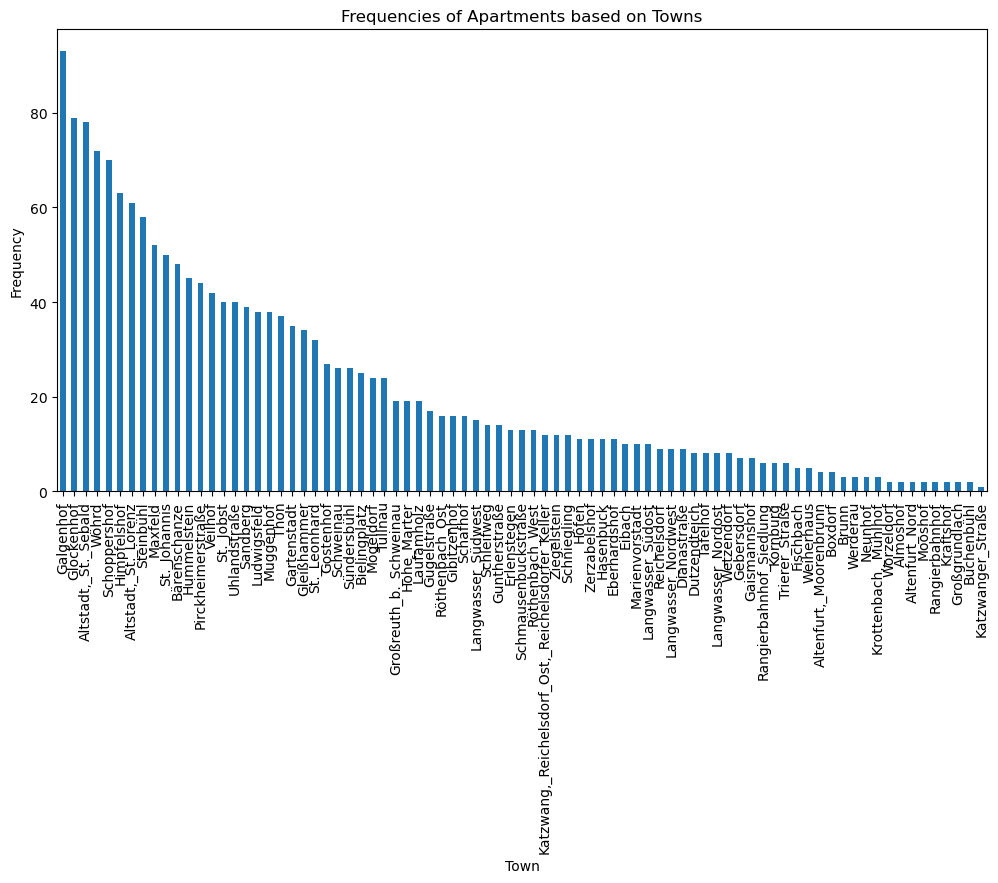

In [34]:
from IPython import display
display.Image("outputs/listing_bar.png")

#### PIE PLOT
```
# Plot the pie chart
plt.figure(figsize=(8, 8))
plt.pie(apartments_wrt_town_sorted.values, labels=apartments_wrt_town_sorted.index, autopct='%1.1f%%')
plt.title('Frequencies of Apartments based on Towns')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle
plt.show()
```

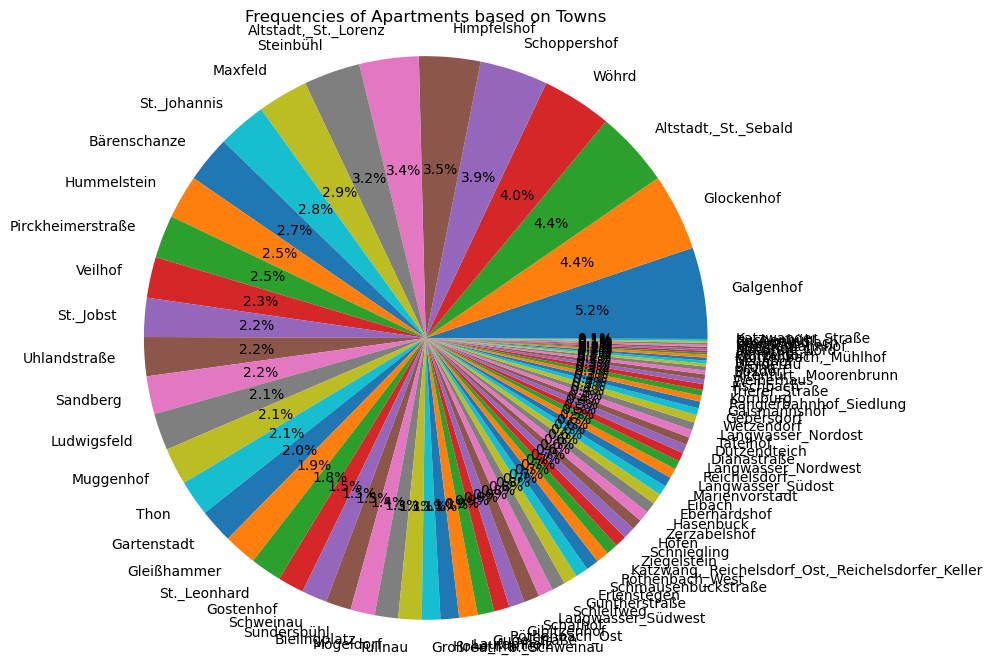

In [35]:
from IPython import display
display.Image("outputs/listing_pie.png")

## 4. Insights and Recommendations:
   - Interpret the correlation analysis results.
   - Provide insights into the relationship between the proximity of public transport stops and rental prices.
   - Make recommendations for renters, landlords, and city planners based on the findings.

#### Heat Map Apartments Based on Towns

```
scale_factor = 1

# Create a map centered on Nuremberg
nuremberg_map = folium.Map(location=[49.4521, 11.0767], zoom_start=12)

# Define a color palette for the circle markers
color_palette = ['blue', 'green', 'red', 'orange', 'purple', 'yellow']

for x in range(len(apartments_wrt_town)):
    if apartments_wrt_town.index[x] in street_coordinates:
        # Get the street coordinates
        coordinates = street_coordinates[apartments_wrt_town.index[x]]
        latitude = [coordinates[0]]
        longitude = [coordinates[1]]
        freq = int(apartments_wrt_town.values[x])  # Convert frequency to integer

        # Iterate over the latitude and longitude values
        for lat, lon, street_name in zip(latitude, longitude, coordinates[2:]):
            # Define the circle's radius based on frequency (adjust the scale_factor to your liking)
            radius = freq * scale_factor

            # Create a circle marker at the current latitude and longitude
            location = [lat, lon]
            # Assign a color based on the index in the color palette
            color = color_palette[apartments_wrt_town.values[x] % len(color_palette)]
            circle_marker = folium.CircleMarker(location=location, radius=radius, color=color,
                                                fill=True, fill_color=color, fill_opacity=0.6)
            # Create a popup with the frequency and street name
            popup_text = f"Street: {street_name} <br> Frequency: {freq}"
            popup = folium.Popup(popup_text, max_width=200)
            # Add the popup to the circle marker
            circle_marker.add_child(popup)
            # Add the circle marker to the map
            circle_marker.add_to(nuremberg_map)


nuremberg_map.save('frequency_map.html')

nuremberg_map
```

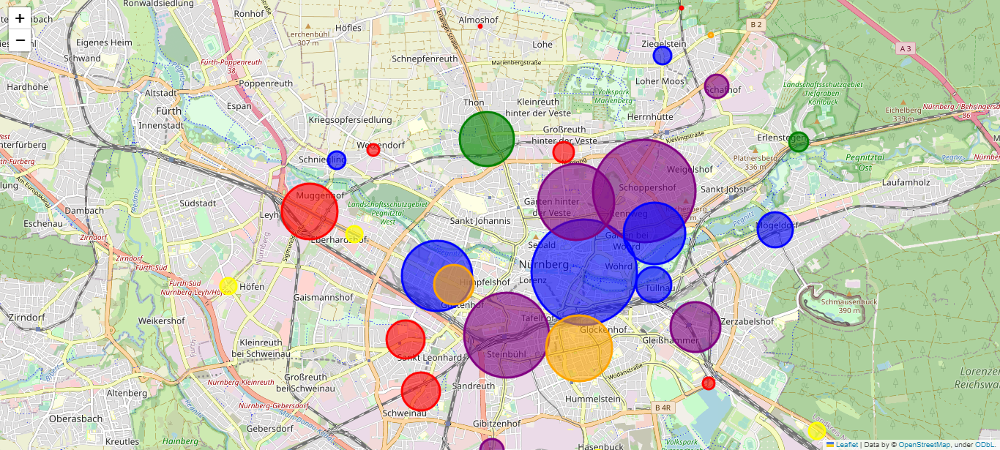

In [42]:
from IPython import display
display.Image("outputs/frequency_map1.png")

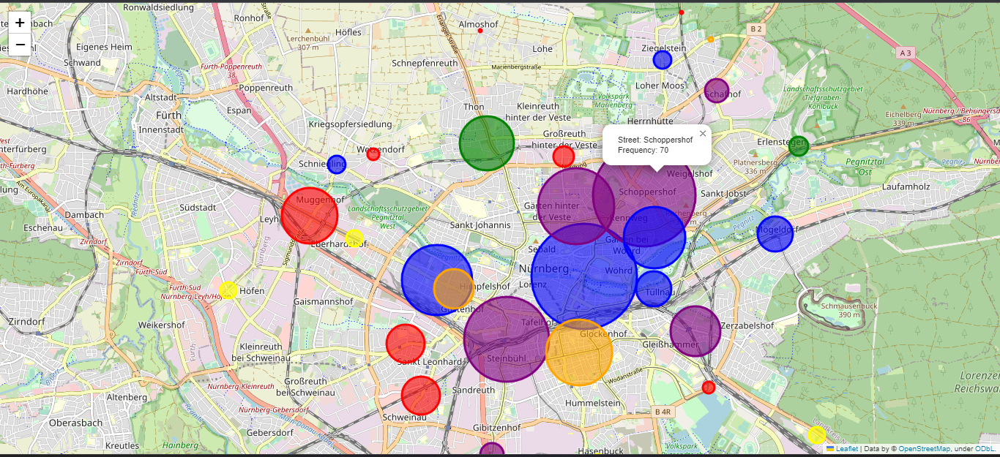

In [43]:
from IPython import display
display.Image("outputs/frequency_map2.png")

#### Optimal Location Selection: Analyzing the rental prices in proximity to public transport stops

```
# Step 2: Calculate Distance using Haversine formula
def haversine(lat1, lon1, lat2, lon2):
    # Convert latitude and longitude from decimal degrees to radians
    lat1_rad, lon1_rad, lat2_rad, lon2_rad = map(radians, [lat1, lon1, lat2, lon2])

    # Haversine formula
    dlon = lon2_rad - lon1_rad
    dlat = lat2_rad - lat1_rad
    a = sin(dlat/2)**2 + cos(lat1_rad) * cos(lat2_rad) * sin(dlon/2)**2
    c = 2 * atan2(sqrt(a), sqrt(1-a))
    distance = 6371 * c  # Radius of the Earth in kilometers
    return distance * 1000  # Convert distance to meters

# Iterate over each row in the DataFrame
for index, row in df_immoscout.iterrows():
    # Initialize an empty list to store distances, stop names, latitudes, and longitudes
    distances = []
    stop_names = []
    stop_latitudes = []
    stop_longitudes = []

    # Calculate the distance between the rental property and all public transport stops
    for stop_index, stop_row in df_nuremberg_stops.iterrows():
        distance = haversine(row['latitude'], row['longitude'], stop_row['latitude'], stop_row['longitude'])
        distances.append(distance)
        stop_names.append(stop_row['stopName'])
        stop_latitudes.append(stop_row['latitude'])
        stop_longitudes.append(stop_row['longitude'])

    # Assign the minimum distance, corresponding stop name, latitude, and longitude to the respective columns
    min_distance_index = distances.index(min(distances))
    df_immoscout.at[index, 'distance_to_stop'] = min(distances)
    df_immoscout.at[index, 'stopName'] = stop_names[min_distance_index]
    df_immoscout.at[index, 'stopLatitude'] = stop_latitudes[min_distance_index]
    df_immoscout.at[index, 'stopLongitude'] = stop_longitudes[min_distance_index]

# Step 3: Filter by Proximity
proximity_threshold = 500  # meters
df_filtered = df_immoscout[df_immoscout['distance_to_stop'] <= proximity_threshold]

# Step 4: Analyze Rental Prices
mean_rental_price = df_filtered['totalRent'].mean()
median_rental_price = df_filtered['totalRent'].median()
std_rental_price = df_filtered['totalRent'].std()

print("mean_rental_price:", mean_rental_price)
print("median_rental_price:", median_rental_price)
print("std_rental_price:", std_rental_price)
```

#### Apartment Price and Stop Correlation

```
# Calculate the correlation
correlation = df_immoscout['totalRent'].corr(df_immoscout['distance_to_stop'])

# Print the correlation value
print("Correlation between total rent and distance:", correlation)
```

##### Results:
Correlation between total rent and distance: 0.02211301431069459

Based on this correlation value, there is no strong evidence to suggest that the distance to the nearest public transport stop has a significant impact on the rental prices in the dataset. Other factors or variables may have a more dominant influence on the rental prices.


mean_rental_price: 771.8260937499999
median_rental_price: 775.0
std_rental_price: 535.7256947365172


#### Blue Marker: Apartment , Red Marker: Stop

Show Stops and Apartments inside the Proximity Threshold
```
# Step 3: Filter by Proximity
proximity_threshold = 500  # meters
df_filtered = df_immoscout[df_immoscout['distance_to_stop'] <= proximity_threshold]

# Step 4: Analyze Rental Prices
mean_rental_price = df_filtered['totalRent'].mean()
median_rental_price = df_filtered['totalRent'].median()
std_rental_price = df_filtered['totalRent'].std()

print("mean_rental_price:", mean_rental_price)
print("median_rental_price:", median_rental_price)
print("std_rental_price:", std_rental_price)

# Step 5: Create a map
nuremberg_map = folium.Map(location=[49.4521, 11.0767], zoom_start=12)

# Step 6: Add markers for rental listings (in blue color)
for index, row in df_filtered.iterrows():
    folium.Marker(location=[row['latitude'], row['longitude']],
                  popup=f"Rental Property: {row['totalRent']}",
                  icon=folium.Icon(color='blue')).add_to(nuremberg_map)

# Step 7: Add markers for public transport stops in proximity (in red color)
for index, row in df_filtered.iterrows():
    folium.Marker(location=[row['stopLatitude'], row['stopLongitude']],
                  popup=f"Stop Name: {row['stopName']}",
                  icon=folium.Icon(color='red')).add_to(nuremberg_map)

# Save the map as an HTML file
nuremberg_map.save('rental_map.html')

nuremberg_map

```

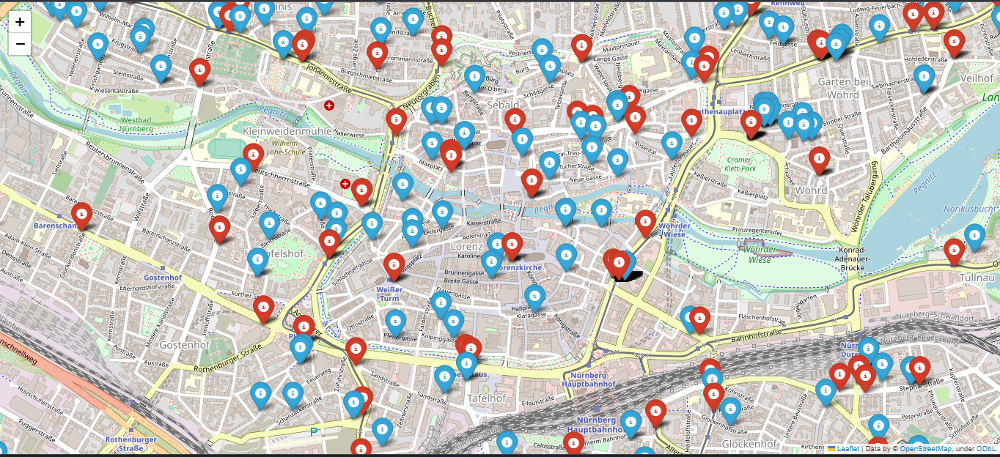

In [48]:
from IPython import display
display.Image("outputs/rental_map1.png")

#### Red Marker: Prompt: Stop Name

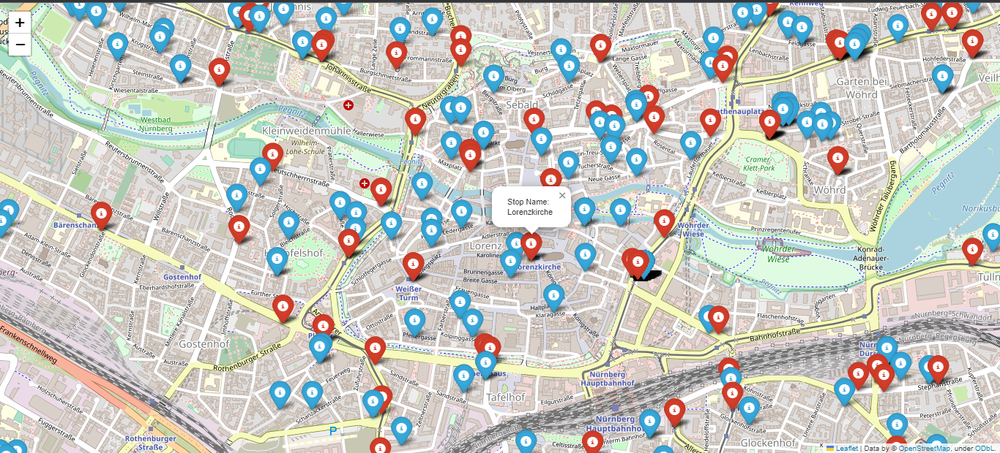

In [49]:
from IPython import display
display.Image("outputs/rental_map2.png")

#### Blue Marker: Prompt: Rental Price Near to Stop

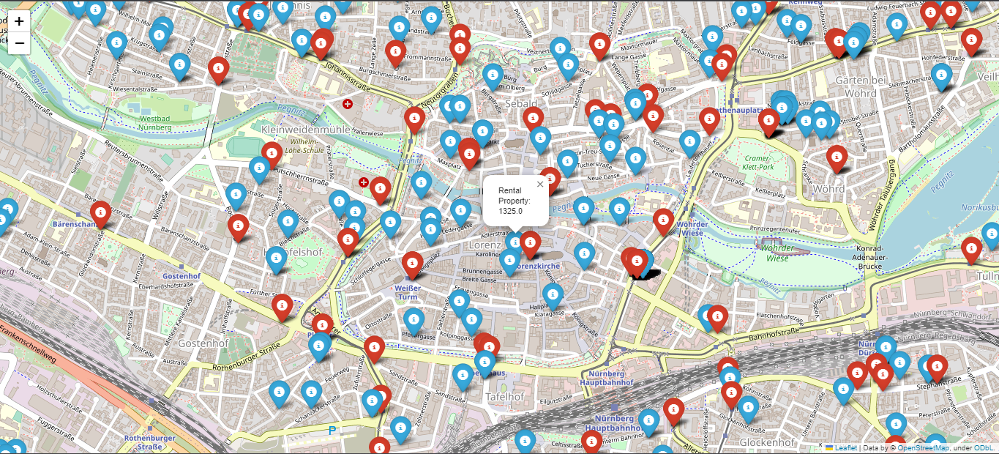

In [50]:
from IPython import display
display.Image("outputs/rental_map3-near.png")

#### Blue Marker: Prompt: Rental Price Far From Stop

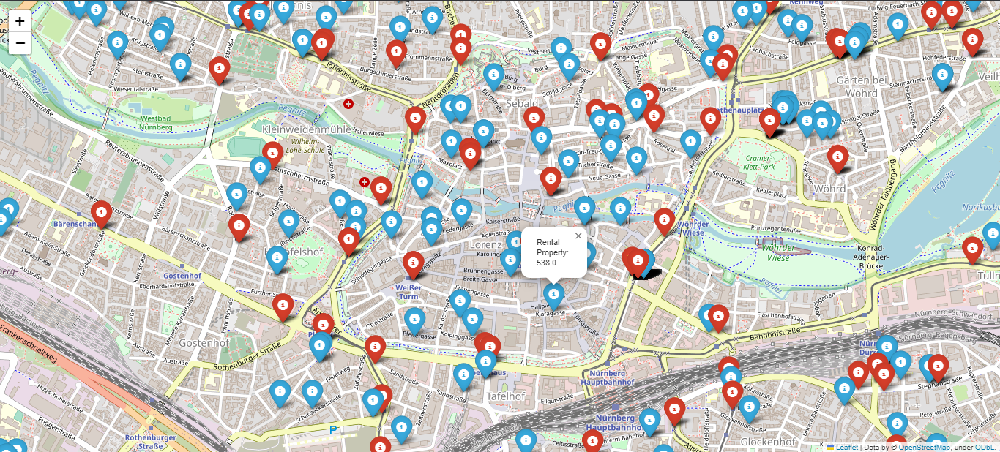

In [51]:
from IPython import display
display.Image("outputs/rental_map4-far.png")


## 5. Documentation and Reporting:
   - Summarize the project, including the rationale, data sources, and project flow.
   - Document the data preprocessing, integration, and analysis steps performed.
   - Include visualizations and insights in the report.

#### Report.ipynb is uploaded to the GitHub repo.